## Data620 Final Project
## NYC Restaurant Rich Dataset (Check-ins, Tips, Tags)
#### Gabriel Santos
#### Date: 05-14-2023 

### Introduction

Foursquare is a platform that combines geolocation tools in digital maps and GPS. It allows you to find, reference or point to a specific place on mobile devices based on physical location. As a user, Foursquare allows you to: find, point to or recommend specific places via mobile based on your location.
Location based social networks have attracted millions of users and massively contains their digital footprints. We have crawled a part of these digital footprints from Foursquare to study the problems of personalized location recommendation and search. This dataset includes check-in, tip, and tag data of restaurant venues in NYC collected from Foursquare from 24 October 2011 to 20 February 2012. It contains 3112 users and 3298 venues with 27149 check-ins and 10377 tips (written in English).
It contains three files in txt format, including 3112 users and 3298 venues with 27149 check-ins and 10377 tips. 

The data can be found here: 

http://www-public.it-sudparis.eu/~zhang_da/pub/dataset_ubicomp2013.zip

Link - Data Source: https://sites.google.com/site/yangdingqi/home/foursquare-dataset

1.	Dataset_ubicomp2013_checkins.txt has two columns. Each line represents a check-in event. The first column is user ID, while the second column is restaurant venues ID. 
2.	Dataset_ubicomp2013_tips.txt has three columns. Each line represents a tip/comment a user left on a restaurant. The first is user ID, the second column is restaurant ID, and the third column is tip text.
3.	Dataset_ubicomp2013_tags.txt has two columns. Each line represents the tags users added to a restaurant. The first column is restaurant ID, the second column is tag set of the corresponding restaurant. Empty tag set may exist for a restaurant since no user has ever added a tag to it.

While the ID of the users and places are anonymous, we can find a match in all three files. In the data set we can see that tips are collected without a time limit, therefore we can see tips, even if a user has not registered in a restaurant.


### Hypothesis


Foursquare users express or rate places of interest in two ways, registering on the site and recommending the place and tipping places. One hypothesis is that a place that people check in frequently indicates that it is a popular place, many people visit it.
A place that is frequently tipped indicates that people are interested in the place and would like to share their experience with all other users. We could try to identify if two places belong to the same community, meaning that people often go to the same types of restaurants, indicating that these places are popular among people with some similarities, for example, same country origin, same culture, or taste for the same type of food. 
Another hypothesis that I want to raise is whether people use more foursquare to express their dissatisfaction with a restaurant or to be able to share an excellent or pleasant experience in a place.


### Preliminary Plan 

The preliminary plan is to explore different networks since I have many data points that can be analyzed for relationships/communities. 
Once I have useful networks, I can then further explore them based on the data such as comparison of communities of users who leave tips or comments.  
Improve network analysis code, all centrality measure analysis. Perform network analysis, including creating graphs, calculating statistics on nodes, and graph visualization. 
Sentiment analysis code, graphical text analysis.

### Libraries

In [11]:
import pandas as pd
import os
import requests
import zipfile
import networkx as nx
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import scipy
from nltk.corpus import stopwords
import itertools
import collections
import re
import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem.porter import PorterStemmer
from nltk.stem import WordNetLemmatizer
from operator import itemgetter

###  Datasets

I have two networks of users and restaurant locations in New York City on Foursquare, from 24 October 2011 to 20 February 2012.

In one network, an edge denotes a check-in event of a user at a restaurant.

In the other, an edge exists if a user left a tip/comment on a restaurant.

I am going to use data like this, userID to identify the users and venueID to identify the restaurants or places.

The users and restaurant venues were all given IDs that keep them all anonymous so we will not know the name of the venue that was visited frequently but will instead reference it by the ID number.

In [106]:
checkin_network.columns = ['userID', 'venueID']
checkin_network.head()

,userID,venueID
0,35443,899
1,24973,42406
2,14860,177
3,222505,177
4,63524,609


For the text analysis that I plan to perform I am going to use the tip text in the tips_network column.

In [14]:
tips_network.columns = ['userID','venueID','tipText']
tips_network.head()

,userID,venueID,tipText
0,24436,15,make your own sandwich: tuna salad on country ...
1,8550,20,The calamari as an appetizer and the quail. Pr...
2,1537,20,Be careful with the napkins on your pants. The...
3,59283,20,"try the steak frites, it's the best - believe me"
4,713,20,go visit google across the street. see the big...


### Creating the Graph

First I initiate the graph object and then we convert the tips_network dataframe into a list of tuples so it can be added as graph edges later.

In [20]:
G = nx.Graph()

In [21]:
records = tips_network[['userID','venueID']]
records = records.to_records(index=False)
tips_tuple = list(records)
tips_tuple[:10]

[(24436, 15),
 (8550, 20),
 (1537, 20),
 (59283, 20),
 (713, 20),
 (40518, 20),
 (33560, 20),
 (17435, 20),
 (59010, 20),
 (59010, 20)]

I create the graph using the userID and venueID. I then loop through the tips data and use the add_edge function to add the edges to our graph.

In [22]:
G.add_nodes_from(checkin_network, bipartite='userID')
G.add_nodes_from(checkin_network, bipartite='venueID')

count = 0
for index, edge in tips_network.iterrows():
    source, dest = int(edge["userID"]), int(edge["venueID"])
    
    G.add_edge(source,dest)
    count +=1
    if count == 1500:
        break

In [23]:
print("Number of nodes - checkin:", G.number_of_nodes())
print("Number of edges - tips:", G.number_of_edges())

Number of nodes - checkin: 1171
Number of edges - tips: 1383


We can see that our network as 1171 nodes from the checkin_network and 1383 edges from the tips_network. 

### Graph Plots

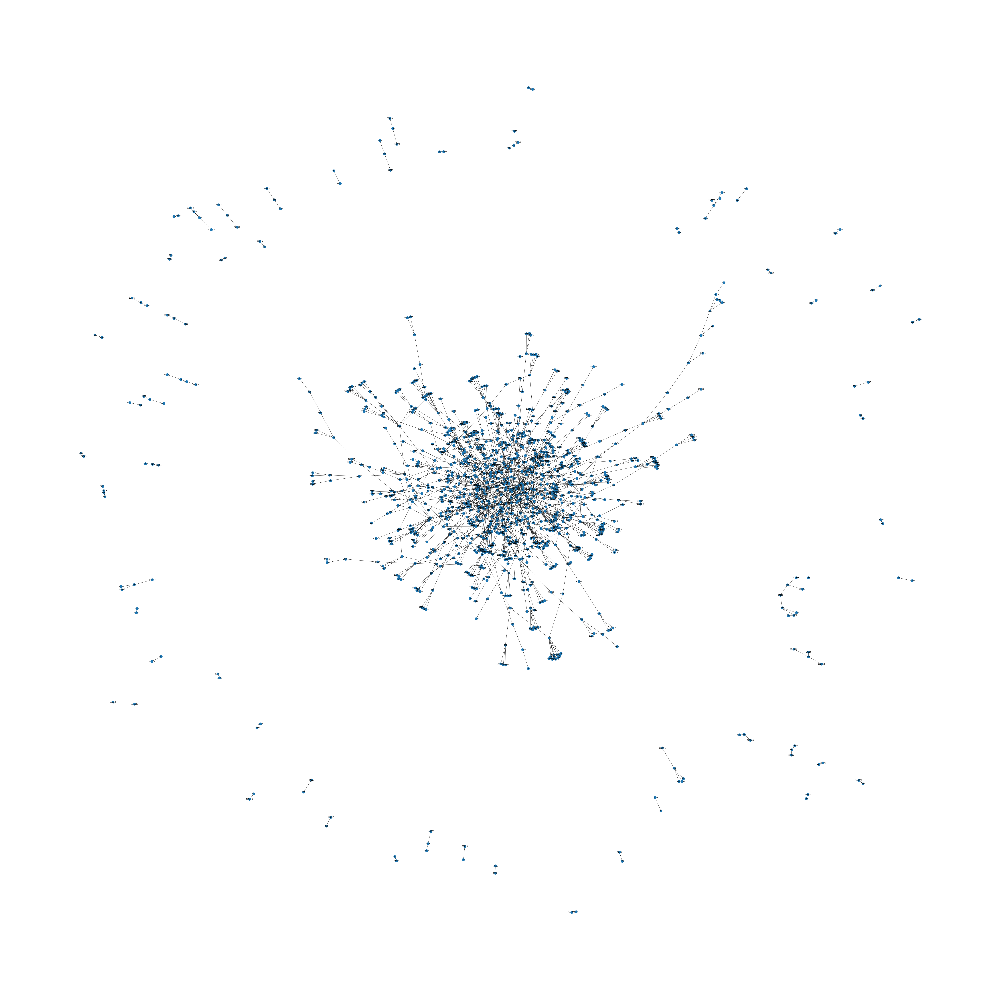

In [32]:
fig = plt.figure(figsize=(90, 90))
nx.draw(G, with_labels=True)

plt.axis('equal') 
plt.show()

According to the previous graph, we can see that there are small connections on the outside of the center frame.
Possibly these connections are from restaurants with low turnover or with restaurants that receive fewer tips.

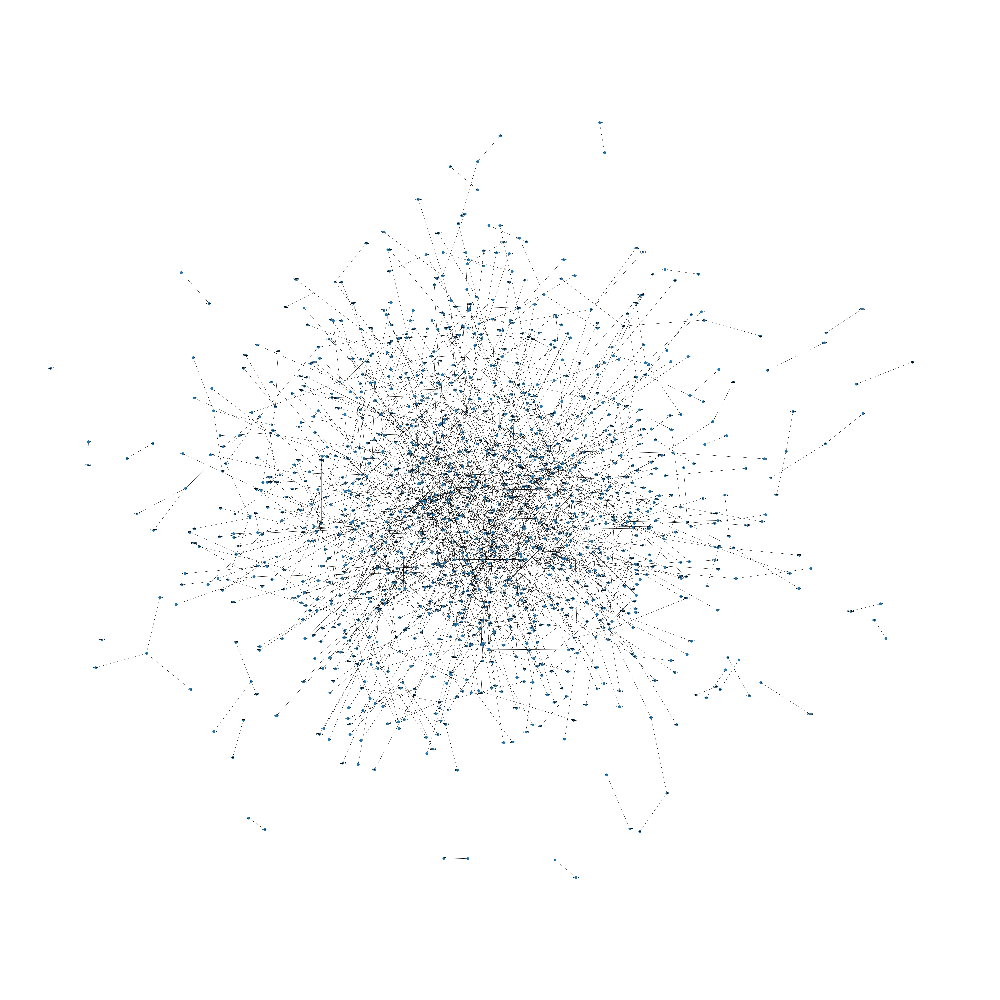

In [33]:
fig = plt.figure(figsize=(90, 90)) 
nx.draw(G, pos=nx.spring_layout(G, iterations=10), with_labels=True)

plt.axis('equal') 
plt.show()

To try to see the graph better we use the spring layout.
With this graph we can see that there are some nodes grouped in the center, which may mean that the same customer has visited several restaurants.
I think we can get better information with centrality measures and text analysis.


In [35]:
G = nx.from_pandas_edgelist(checkin_network, 'userID','venueID')
count = 0

tips_network_graph = nx.Graph()

for index, edge in tips_network.iterrows():
    source, dest = int(edge["userID"]), int(edge["venueID"])
    
    tips_network_graph.add_edge(source, dest)
    count += 1
    if count == 1500:
        break

### Centrality Measures

Centrality indicators are measures used in graph theory and network analysis to identify important or central nodes in a network.
These indicators make it possible to identify which nodes are most important in the structure and operation of the network.
We will apply these measures to the dataset to identify which users contributed the highest degree of centrality.

In [43]:
print("Number of nodes:", nx.number_of_nodes(G))
print("Number of edges:", nx.number_of_edges(G))

Number of nodes: 4871
Number of edges: 13472


In [44]:
degree_dict = dict(G.degree(G.nodes()))
nx.set_node_attributes(G, degree_dict, 'degree')

sorted_degree = sorted(degree_dict.items(), key=itemgetter(1), reverse=True)
print("Top 10 nodes by degree:")
for d in sorted_degree[:10]:
    print(d)

Top 10 nodes by degree:
(45720, 88)
(4156, 85)
(3184, 64)
(21501, 52)
(25321, 44)
(1086, 42)
(21380, 42)
(564, 41)
(476, 40)
(51152, 40)


#### Most influential

The degree centrality method is node based and has the advantage of easy identification of most influential nodes. 

In [47]:
degree_dict = nx.degree_centrality(G)
sorted_degree = sorted(degree_dict.items(), key=itemgetter(1), reverse=True)
print("Top 10 nodes by degree centrality:")
for d in sorted_degree[:10]:
    print(d)

Top 10 nodes by degree centrality:
(45720, 0.018069815195071868)
(4156, 0.017453798767967144)
(3184, 0.013141683778234086)
(21501, 0.010677618069815195)
(25321, 0.009034907597535934)
(1086, 0.008624229979466118)
(21380, 0.008624229979466118)
(564, 0.008418891170431212)
(476, 0.008213552361396304)
(51152, 0.008213552361396304)


 #### Closeness centrality:

The closeness centrality of a node measures its average farness to all other nodes. Nodes with a high closeness score have the shortest distances to all other nodes.

In [48]:
closeness_dict = nx.closeness_centrality(G)
sorted_closeness = sorted(closeness_dict.items(), key=itemgetter(1), reverse=True)
print("Top 10 nodes by  closeness:")
for d in sorted_closeness[:10]:
    print(d)

Top 10 nodes by  closeness:
(4156, 0.29504830428872675)
(21501, 0.2848778341533086)
(1002, 0.2844573626777015)
(3184, 0.2810229693225376)
(45720, 0.28077731987382915)
(1086, 0.2725499948543335)
(476, 0.27127632503997)
(12991, 0.27012046919520705)
(5918, 0.2692750689674681)
(25321, 0.26926002062338816)


#### Betweeness centrality

The betweenness centrality of a node is defined as the fraction of the shortest paths in the graph that pass through that node.
A node with a high betweenness centrality is one that lies on many shortest paths between other nodes in the graph.

In [49]:
betweenness_dict = nx.betweenness_centrality(G)
sorted_betweenness = sorted(betweenness_dict.items(), key=itemgetter(1), reverse=True)
print("Top 10 nodes by betweenness centrality:")
for d in sorted_betweenness[:10]:
    print(d)

Top 10 nodes by betweenness centrality:
(4156, 0.06468060353113629)
(45720, 0.037515018772114)
(3184, 0.03273972916857997)
(21501, 0.028033316450169734)
(476, 0.019350863037523574)
(1086, 0.018479840917964396)
(564, 0.016328270726919485)
(1002, 0.0158612559397987)
(5918, 0.01551474552672959)
(51152, 0.015399018209395146)


#### Eigenvector centrality

Eigenvector centrality is a measure of centrality in a graph that is based on the idea that the importance of a node in the network is related to the importance of its neighbors.
In particular, eigenvector centrality assigns a centrality score to a node based on the sum of its neighbors' centrality scores weighted by its own centrality score.

In [50]:
eigenvector_centrality_dict = nx.eigenvector_centrality(G)
sorted_eigenvector = sorted(eigenvector_centrality_dict.items(), key=itemgetter(1), reverse=True)
print("Top 10 nodes by eigenvector centrality:")
for d in sorted_eigenvector[:10]:
    print(d)

Top 10 nodes by eigenvector centrality:
(4156, 0.23950325539991285)
(45720, 0.20341376962528718)
(21501, 0.1602467226048354)
(3184, 0.13518402845383462)
(1002, 0.10323891423649523)
(23209, 0.0944410008256068)
(5918, 0.0904903925637331)
(72909, 0.08673047302017127)
(10604, 0.08569048253852549)
(476, 0.0853264542395414)


### Ego network

An ego network is a subnet in a graph centered on a particular node called ego.
In an ego network, the ego is the central node and the other nodes in the network are the direct neighbors of the ego, that is, the nodes that are directly connected to the ego.
The study of ego networks is important in the analysis of social networks, since it allows examining the characteristics of social relationships and the influence of ego in its immediate social network.

In [57]:
S = [G.subgraph(c).copy() for c in nx.connected_components(G)]

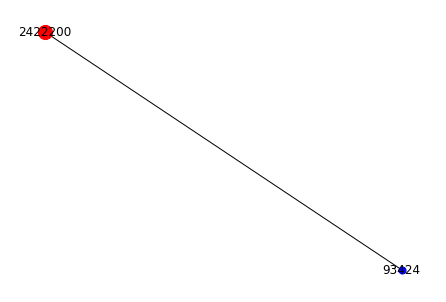

In [58]:
from operator import itemgetter
node_and_degree = S[0].degree()
(largest_hub, degree) = sorted(node_and_degree, key=itemgetter(0))[-1]
hub_ego=nx.ego_graph(S[0],largest_hub)

pos = nx.spring_layout(hub_ego)
nx.draw(hub_ego, pos, node_color="b", node_size=50, with_labels=True)

options = {"node_size": 200, "node_color": "r"}
nx.draw_networkx_nodes(hub_ego, pos, nodelist=[largest_hub], **options)
plt.show()

The ego is identified in the red color.

In [59]:
nx.write_gexf(G, 'foursquare.gexf')

### Sentiment Analysis

In [54]:
import nltk
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('omw-1.4')
nltk.download('stopwords')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\tqkar\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\tqkar\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\tqkar\AppData\Roaming\nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\tqkar\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping corpora\stopwords.zip.


True

#### Clean the data

Performing data cleaning on the tips column.This is requried to remove special symbols, convert the text to lower case.The resulting list still contains all the rows but with treatment done on the text.

Performing data cleaning on the tips column.This is requried to remove special symbols, convert the text to lower case. The resulting list still contains all the rows but with treatment done on the text.

In [60]:
cult_list=[]

for cult in tips_network.tipText:
    cult=re.sub("[^a-zA-z]"," ",cult) 
    cult=cult.lower()
    cult=word_tokenize(cult)
    lemma=WordNetLemmatizer()
    cult=[lemma.lemmatize(word) for word in cult]
    cult=" ".join(cult)
    cult_list.append(cult)

Now we will make a list of lists containing lowercase words for each reviewAhora creo una list of lists containing lowercase words for each review

In [62]:
words_in_tip = [tip.split() for tip in cult_list]

List of all words across reviews and create counter:

In [63]:
all_words = list(itertools.chain(*words_in_tip))
counts = collections.Counter(all_words)
counts.most_common(15)

[('the', 9021),
 ('and', 3908),
 ('a', 3625),
 ('is', 2925),
 ('to', 2159),
 ('of', 2016),
 ('in', 1861),
 ('for', 1853),
 ('it', 1799),
 ('you', 1785),
 ('with', 1506),
 ('i', 1332),
 ('great', 1249),
 ('get', 1210),
 ('best', 1187)]

There is a need to remove stop words from the Text:

In [66]:
raw_tips = pd.DataFrame(counts.most_common(100),
                             columns=['words', 'count'])

raw_tips.head()

,words,count
0,the,9021
1,and,3908
2,a,3625
3,is,2925
4,to,2159


Adding additional list of keywords to the stopwords available in the ntlk library:

In [67]:
stop_list = nltk.corpus.stopwords.words('english')
newStopWords = ['wa','\\','via','fondu','foodspotting']
stop_list.extend(newStopWords)
filtered_words = []
for w in all_words:
    if w not in stop_list:
        filtered_words.append(w)

The list looks much better now. Bit of back and forth was performed to add more stop words above.

In [70]:
counts = collections.Counter(filtered_words)
counts.most_common(10)

[('great', 1249),
 ('get', 1210),
 ('best', 1187),
 ('try', 1114),
 ('good', 1010),
 ('food', 869),
 ('place', 707),
 ('go', 632),
 ('amazing', 527),
 ('order', 498)]

We can see:

In [71]:
clean_tips = pd.DataFrame(counts.most_common(100),
                             columns=['words', 'count'])

clean_tips.head()

,words,count
0,great,1249
1,get,1210
2,best,1187
3,try,1114
4,good,1010


We can see that the largest number of words have a positive meaning.

Let's visualize the most used words:

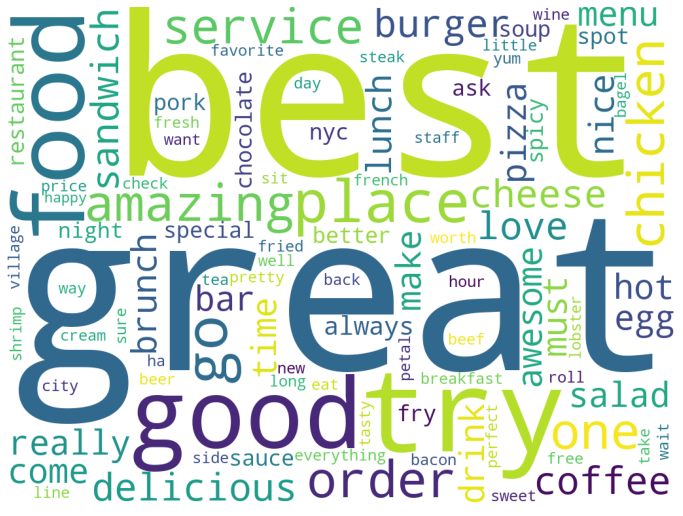

In [78]:
from textblob import TextBlob
from wordcloud import WordCloud 
import matplotlib.pyplot as plt

plt.subplots(figsize=(12,12))
wordcloud=WordCloud(background_color="white",width=1024,height=768).generate(" ".join(clean_tips.words[0:100]))
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

We can see that the most used words are positive adjectives: Great, best, good.

We are going to identify by means of certain words if the opinion of a user was positive or negative.
We can calculate the sentiment through the polarity function. Polarity ranges from -1 to 1, with -1 being negative and 1 being positive.
The TextBlob can also use the subjectivity function to calculate subjectivity, which ranges from 0 to 1, with 0 being objective and 1 being subjective.

In [81]:
df = pd.DataFrame(tips_network.tipText)
df.columns = ['tips']

from textblob import TextBlob
df['polarity'] = df['tips'].apply(lambda x: TextBlob(x).polarity)
df['subjective'] = df['tips'].apply(lambda x: TextBlob(x).subjectivity)

#### Polarity and subjectivity

In [83]:
df

,tips,polarity,subjective
0,make your own sandwich: tuna salad on country ...,0.300000,0.500000
1,The calamari as an appetizer and the quail. Pr...,0.550000,0.737500
2,Be careful with the napkins on your pants. The...,-0.250000,0.850000
3,"try the steak frites, it's the best - believe me",1.000000,0.300000
4,go visit google across the street. see the big...,0.000000,0.100000
...,...,...,...
10372,Way too crowded due to the construction at 7th...,0.187500,0.687500
10373,Not for the faint of heart,-0.500000,1.000000
10374,It's goin down Tonight on The Stage (Open Mic ...,-0.077778,0.394444
10375,"In 2011, 60% of the 25,000 orange, red and whi...",0.125000,0.275000


The polarity is mostly positive, and the subjectivity tends to 1.
The subjectivity that tends to be 1 makes sense since it deals with opinions that customers leave about restaurants.

In [66]:
df.median()

C:\Users\tqkar\AppData\Local\Temp\ipykernel_31784\1874492015.py:3: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df.median()


polarity      0.225
subjective    0.525
dtype: float64

We can observe that the median values of the polarity is positive at 0.225 and subjecticity is higher at 0.525.

We can observe some positive tips:

In [86]:
df[df['polarity']>0].head()

,tips,polarity,subjective
0,make your own sandwich: tuna salad on country ...,0.300000,0.5000
1,The calamari as an appetizer and the quail. Pr...,0.550000,0.7375
3,"try the steak frites, it's the best - believe me",1.000000,0.3000
5,Great drinks & good appetizers. Love the desse...,0.666667,0.6500
10,When here you have to order the Mac & Cheese. ...,0.600000,0.9000


We can observe some tips with polarity 0 and subjective 0, but reading them they are not negative tips, but less subjective, more general tips.

In [87]:
df[df['subjective']<0.1].head()

,tips,polarity,subjective
6,Try the English breakfast,0.0,0.0
8,And by the way if u are looking for a Job on a...,0.0,0.0
9,Go for the grattin dauphinois!,0.0,0.0
11,People watching + Cheesecake + Sex & The City,0.0,0.0
12,para brunchear,0.0,0.0


We can read some tips with high subjective, the tips have adjectives, so we can say that they have a greater subjectivity. 

In [88]:
df[df['subjective']>0.7].head()

,tips,polarity,subjective
1,The calamari as an appetizer and the quail. Pr...,0.55000,0.7375
2,Be careful with the napkins on your pants. The...,-0.25000,0.8500
10,When here you have to order the Mac & Cheese. ...,0.60000,0.9000
28,Grilled corn+mojito+beer+garlic shrimp+Cuban s...,1.00000,1.0000
30,"Ask Mike, the bartender, to put some Val Dooni...",0.78125,0.9000


I am going to verify if not only using one word, but taking two or 3 words into account, the polarity is improved.
You might think that the polarity and subjectivity are higher with 2 or 3 words in the tip.

In [91]:
from sklearn.feature_extraction.text import CountVectorizer
c_vec = CountVectorizer(stop_words=stop_list, ngram_range=(2,3))

ngrams = c_vec.fit_transform(df['tips'])
count_values = ngrams.toarray().sum(axis=0)
vocab = c_vec.vocabulary_
df_ngram = pd.DataFrame(sorted([(count_values[i],k) for k,i in vocab.items()], reverse=True)
            ).rename(columns={0: 'frequency', 1:'bigram_trigram'})

#### Polarity and subjectivity

In [92]:
df_ngram['polarity'] = df_ngram['bigram_trigram'].apply(lambda x: TextBlob(x).polarity)
df_ngram['subjective'] = df_ngram['bigram_trigram'].apply(lambda x: TextBlob(x).subjectivity)

In [94]:
df_ngram

,frequency,bigram_trigram,polarity,subjective
0,115,one best,1.000000,0.300000
1,106,village voice,0.000000,0.000000
2,105,make sure,0.500000,0.888889
3,93,happy hour,0.800000,1.000000
4,91,new york,0.136364,0.454545
...,...,...,...,...
119497,1,00 anywhere,0.000000,0.000000
119498,1,00 11 00,0.000000,0.000000
119499,1,00 11,0.000000,0.000000
119500,1,00 10 30am,0.000000,0.000000


We can see that the polarity is more positive and the subjectivity tends to 0 compared to a single word.

In [95]:
df_ngram.median()

C:\Users\tqkar\AppData\Local\Temp\ipykernel_66888\2968909550.py:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_ngram.median()


frequency     1.0
polarity      0.0
subjective    0.0
dtype: float64

Most 2 or 3 word tips have zero (neutral) polarity and subjectivity.

### NNMF tecnique

NNMF technique (nonnegative matrix factorization) is a method of decomposing a matrix into two smaller nonnegative matrices.
NNMF is commonly used in data analysis applications such as dimensionality reduction and data clustering, it can also be used to extract latent features from a data matrix, which can be useful in classification and pattern recognition.

In [100]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import NMF
from sklearn.pipeline import make_pipeline
tfidf_vectorizer = TfidfVectorizer(stop_words=stop_list, ngram_range=(2,3))
nmf = NMF(n_components=5)
pipe = make_pipeline(tfidf_vectorizer, nmf)
pipe.fit(df['tips'])
def print_top_words(model, feature_names, n_top_words):
    for topic_idx, topic in enumerate(model.components_):
        message = "Topic #%d: " % topic_idx
        message += ", ".join([feature_names[i]
                             for i in topic.argsort()[:-n_top_words - 1:-1]])
        print(message)
    print()
print_top_words(nmf, tfidf_vectorizer.get_feature_names(), n_top_words=5)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\decomposition\_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


Topic #0: say thank vote, thank vote, say thank, loving prayers, combo answer sushi
Topic #1: ly 8qjdq, ow ly 8qjdq, village voice excited, restaurants http, restaurants http ow
Topic #2: app online, order app online, order app, straight register, app online beat
Topic #3: try apple, try apple crumble, apple crumble, crumble vanilla custard, crumble vanilla
Topic #4: better service, smile always better, always better service, big smile, big big smile



C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


The results show the top 5 topics where topic #0 and topic #4 are positive tips.
Topics #2 and topic #3 are recommendations and topic #1 has to do with online registrations.

### LDA technique

LDA (Linear Discriminant Analysis) is a multivariate analysis technique used to find the most discriminating characteristics between two or more classes of data.
LDA is used to find a feature subspace that is optimal for class separation in a data set.

In [101]:
from sklearn.decomposition import LatentDirichletAllocation
tfidf_vectorizer = TfidfVectorizer(stop_words=stop_list, ngram_range=(2,3))
lda = LatentDirichletAllocation(n_components=5)
pipe = make_pipeline(tfidf_vectorizer, lda)
pipe.fit(df['tips'])
def print_top_words(model, feature_names, n_top_words):
    for topic_idx, topic in enumerate(model.components_):
        message = "Topic #%d: " % topic_idx
        message += ", ".join([feature_names[i]
                             for i in topic.argsort()[:-n_top_words - 1:-1]])
        print(message)
    print()
print_top_words(lda, tfidf_vectorizer.get_feature_names(), n_top_words=5)

Topic #0: free wifi, love place, happy hour, try apple, one best
Topic #1: pretty good, mac cheese, french toast, lobster roll, really good
Topic #2: make sure, happy hour, soup dumplings, really good, great food
Topic #3: say thank, say thank vote, thank vote, one best, bloody mary
Topic #4: village voice, ow ly, http ow, http ow ly, list restaurants http



We can see that more descriptive words appear in topic #1 and topic #2.
The result is similar to the previous technique.

#### Filter node (userID)

I am going to filter the node (userID) that has the highest degree of centrality to check the polarity of this node and the subjectivity of this node.

In [104]:
tips_network_45720 = tips_network[tips_network.userID == 45720]

df1 = pd.DataFrame(tips_network_45720.tipText)
df1.columns = ['tips']

df1['polarity'] = df1['tips'].apply(lambda x: TextBlob(x).polarity)
df1['subjective'] = df1['tips'].apply(lambda x: TextBlob(x).subjectivity)

In [105]:
df1.median()

C:\Users\tqkar\AppData\Local\Temp\ipykernel_66888\2279417019.py:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df1.median()


polarity      0.433333
subjective    0.702083
dtype: float64

The user with the highest degree of centrality (userID = 45720) actually contributed to positive polarity compared to the network average. Subjectivity is high.

In [78]:
df1

,tips,polarity,subjective
2393,"The Duck, Pork, and Chicken Congee is so amazi...",-0.046875,0.587500
2852,They make a fantastic Tonkatsu Ramen that has ...,0.583333,0.816667
6220,Try the Schaw soup! Really bright flavors and ...,0.450000,0.550000
9592,The Tuna Melt was amazing. Huge and served on ...,0.416667,0.883333


We can see that the tips are positive and are mostly related to oriental food.

## Conclusion

In this project I was able to apply concepts that I learned in this course, visualize the data through graphs. Notice the nodes and the edges.
I measured the degree of centrality of each one of the nodes, also carried out a sentiment analysis according to the tips of the users who made observations or recommendations on Foursquare.
 
Notice that the user who contributed the highest degree of centrality actually contributed positively to the network polarity, since the user's average value is higher than the network's average polarity value.

From topic modeling, I can conclude that topics like oriental food and meats have positive suggestion reviews, as evidenced by the user ID with the highest degree of centrality. You might think that people with a taste for meat or oriental food are popular.

According to the project, I can also conclude that most of the reviews are positive, most are subjective and others are general. But negative reviews are few.

